# First simple web-map with Folium


**Date**: 22.03.2023

**Course**: Methods of Spatial Analysis. Advanced Level. // HSE, Moscow, spring 2023


## 1. Import libraries


In [278]:
## For working with dataframes

import pandas as pd
import geopandas as gpd
import folium

from shapely import geometry


## 2.Read data from a geojson file


In [279]:
data = gpd.read_file('./tomsk_okn_final.gpkg')
data_poly = gpd.read_file('./tomsk.geojson')
data.head()

,field_1,№ пп,Наименование объекта культурного наследия,Тип ОКН,address,"Сведения о регистрации в едином государственном реестре объектов культурного наследия (номер, приказ)",Реквизиты акта об утверждении территории объекта культурного наследия (координаты указаны в приложении к акту),Реквизиты акта об утверждении зоны охраны объекта культурного наследия (координаты указаны в приложении к акту),Сведения о защитной зоне охраны объекта культурного наследия,"Координата, X","Координата, Y",Latitude,Longitude,layer,path,geometry
0,1,1,"Здание Мясных рядов, XIXв.",федеральный,"Томская область, г.Томск, Ленина площадь,4 (Ба...",701610657930006 Приказ Минкультуры России,-,Постановление Администрации Томской области от...,не применяются в соответствии с п.3. ст.3 Феде...,None,None,56.487573,84.947334,tomsk_okn_edit,/Users/iratyuleneva/Downloads/tomsk_okn_edit.g...,POINT (84.94733 56.48757)
1,2,2,"Жилой дом (деревянный), XIXв.",федеральный,"Томская область, г.Томск, Белинского улица, 19...",721410014700006 Приказ Минкультуры России,Приказ Департамента по культуре Томской област...,Постановление Администрации Томской области от...,не применяются в соответствии с п.3. ст.3 Феде...,None,None,56.471109,84.957656,tomsk_okn_edit,/Users/iratyuleneva/Downloads/tomsk_okn_edit.g...,POINT (84.95766 56.47111)
2,3,3,"Дом, в котором останавливался Радищев Александ...",федеральный,"Томская область, г.Томск, Бакунина (улица) 26 ...",701510204220006 Приказ Минкультуры России,Приказ Департамента по культуре Томской област...,Постановление Администрации Томской области от...,не применяются в соответствии с п.3. ст.3 Феде...,None,None,56.493636,84.955581,tomsk_okn_edit,/Users/iratyuleneva/Downloads/tomsk_okn_edit.g...,POINT (84.95558 56.49364)
3,4,4,"Дом жилой (дер.), нач.ХХв.",федеральный,"Томская область, г.Томск, Вершинина (улица) 12...",701410201180006 Приказ Минкультуры России,Приказ Департамента по культуре Томской област...,Постановление Администрации Томской области от...,не применяются в соответствии с п.3. ст.3 Феде...,None,None,56.472093,84.963675,tomsk_okn_edit,/Users/iratyuleneva/Downloads/tomsk_okn_edit.g...,POINT (84.96367 56.47209)
4,5,5,"Жилой дом (деревянный), XIX в.",федеральный,"Томская область, г.Томск, Войкова (улица) 23 (...",701410060420006 Приказ Минкультуры России,Приказ Департамента по культуре Томской област...,Постановление Администрации Томской области от...,не применяются в соответствии с п.3. ст.3 Феде...,None,None,56.500045,84.942627,tomsk_okn_edit,/Users/iratyuleneva/Downloads/tomsk_okn_edit.g...,POINT (84.94263 56.50005)


#### \* clear data and save only valuable attributes

(here is an example how to drop fields, you may need to delete more/less depends, you may choose another way to remove attributes )


## 2.Create Grid (fishnet)

- to plot concentration of cultural heritage (or any other point layer) with a choropleth map


#### 2.1. Check CRS of current data and decide do you need to reproject it or not?


- here is an example of reading the current crs and reprojecting geodataframe to another crs (you need to choose by yourself do you need it or not), but I'd rather reccommend to use UTM-zone, when you plot data with folium it is better to choose Web Mercator (EPSG:3857)


In [280]:
data=data.to_crs("EPSG:32645")
print(data.crs.name)


WGS 84 / UTM zone 45N


#### 2.2. Get the extent of the data


In [281]:
total_bounds = data.total_bounds
minX, minY, maxX, maxY = total_bounds
total_bounds

array([ 372656.50449897, 6257527.34761482,  385087.66386352,
       6268636.73370839])

#### 2.3. Select cell-size


- what are the units?


In [282]:
square_size = 400

#### 2.4. Create fishnet


- you may choose another way to create using QGIS and read prepared data here


In [283]:
grid_cells = []
x, y = (minX, minY)
geom_array = []

while y <= maxY:
        while x <= maxX:
            geom = geometry.Polygon([(x,y), (x, y+square_size), (x+square_size, y+square_size), (x+square_size, y), (x, y)])
            geom_array.append(geom)
            x += square_size
        x = minX
        y += square_size


fishnet = gpd.GeoDataFrame(geom_array, columns=['geometry']).set_crs('EPSG:32645')
fishnet['id'] = fishnet.index

- save final grid to file if you need it


## 3. Count Points in Polygon


#### 3.1. Merge fishnet and your points data to count them in polygons


In [284]:
merged = gpd.sjoin(data, fishnet, how='left', predicate='within')
merged['n'] = 1
dissolve = merged.dissolve(by="index_right", aggfunc="count")
fishnet.loc[dissolve.index, 'n'] = dissolve.n.values


#### 3.2. Plot the result


- we do it just to check the final result, no any other practical need


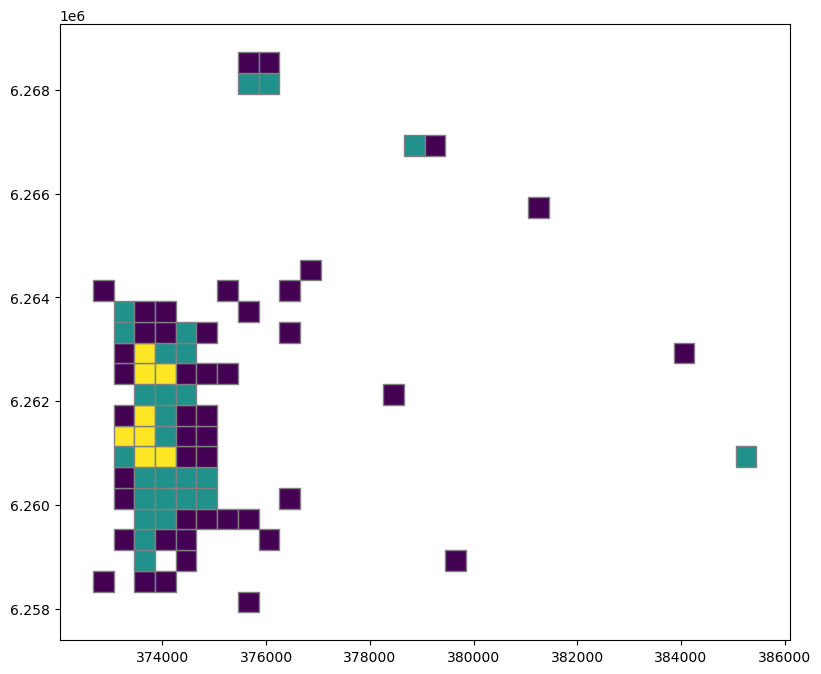

In [285]:
ax = fishnet.plot(column='n', figsize=(12, 8), cmap='viridis', scheme='natural_breaks', k=3, edgecolor="grey")


## 3. Create Web-map


#### 3.1 Map Settings

- carefully look at the function, try to understand what each variable stands for


In [314]:
data = data.to_crs('EPSG:4326')
m = folium.Map(location=[data.centroid.y.mean(), data.centroid.x.mean()], zoom_start=12,  tiles="cartodb positron", control_scale=True)


/var/folders/wl/5_4cp0c15lx3czsgr6wbw_3m0000gn/T/ipykernel_94998/440777897.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[data.centroid.y.mean(), data.centroid.x.mean()], zoom_start=12,  tiles="cartodb positron", control_scale=True)


#### 3.2 Explore the map box. Do we need any changes?


In [315]:
m

#### 3.3 Create a Choropleth map based on a fishnet


In [316]:
folium.Choropleth(
    geo_data=fishnet,
    data=fishnet,
    columns=['id', 'n'],
    fill_color='PiYG',
    fill_opacity = 0.5,
    key_on='id',
    nan_fill_opacity=0,
   line_color = "#0000",
   legend_name="концентрация объектов культурного наследия",
   name='Концентрация ОКН'
).add_to(m)

- look a the map


In [317]:
m

#### 3.4 Add heritage buildings with tooltips


- try to color heritage buildings based on their conservation status


In [318]:
colors = ["orange", "purple", "green", "blue"]
categories = data_poly['typeokn'].unique()

folium.GeoJson(
    data_poly,
    name="Границы зданий ОКН",
    tooltip=folium.GeoJsonTooltip(fields=["Наименование объекта культурного наследия","Тип ОКН"]),
    popup=folium.GeoJsonPopup(fields=['Наименование объекта культурного наследия','Тип ОКН']),
    style_function=lambda x: {
        "fillColor": colors[x['properties']['typeokn']],
        "lineColor": colors[x['properties']['typeokn']]
    },
    highlight_function=lambda x: {"fillOpacity": 0.8},
    zoom_on_click=True,
    show=True,
).add_to(m)


- look a the map


In [319]:
m

#### 3.5 Add points cluster


In [320]:
from folium.plugins import MarkerCluster

In [321]:
marker_cluster = MarkerCluster(name='Отметки ОКН')
mc1= folium.plugins.FeatureGroupSubGroup(marker_cluster, 'Отметки ОКН')
m.add_child(marker_cluster)
m.add_child(mc1)
mc1.add_child(folium.GeoJson(data.to_json(), embed=True, show=True, zoom_on_click=True))


In [322]:
m

#### 3.6 Add different widgets to map


- import plugins


In [323]:
from folium.plugins import MousePosition
from folium.plugins import Fullscreen

In [324]:
folium.LayerControl().add_to(m)

In [325]:
MousePosition().add_to(m)
Fullscreen(
    position="bottomright",
    title="Expand me",
    title_cancel="Exit me",
    force_separate_button=True,
).add_to(m)


In [326]:
m

## 4. Save map to index.html file and prepare to publish it


In [327]:
m.save("index.html")